# Autoencoder Para detección de fraude

# Trabajo Semana 8
### Asignatura: Machine Learning
#### Especialización en Inteligencia Artificial
#### Integrantes:

* Jorge Armando Serrano Duque
* Daniel Cadavid Zuleta
* Oscar Yesid Cárdenas Santos
* Saúl Andrés Garnica Gutiérrez
* Michael Andrés Mora Poveda


 **El autoencoder tiene diferentes aplicaciones algunas son:**

*   Eliminación de ruido
*   Anonimización de datos

*   Criptografía y seguridad
*   Agrupamiento semántico

*   Generación de nuevos datos
*   Imputación de datos perdidos

*   Reducción de dimensionalidad
*   Identificación de anomalías

**En este caso mediante la identificación de anomalías, se identificará el fraude**

**El autoencoder tiene diferentes aplicaciones una de ellas es a la identificación de anomalías o datos atípicos o en inglés (outliers) es una observación que es numéricamente distante del resto de los datos.**

In [34]:
%%html
<p style='text-align: justify;'> <b>Una aplicación del autoencoder es la reducción de ruido en una imagen, se debe tener un dato de entrada, luego un codificador, se comprime la imagen y un decodificador para que la imagen este sin ruido. En este caso el dato de entrada es una imagen con ruido y el dato de salida es la misma imagen sin ruido(ver imagen a continuación) </b> </p>


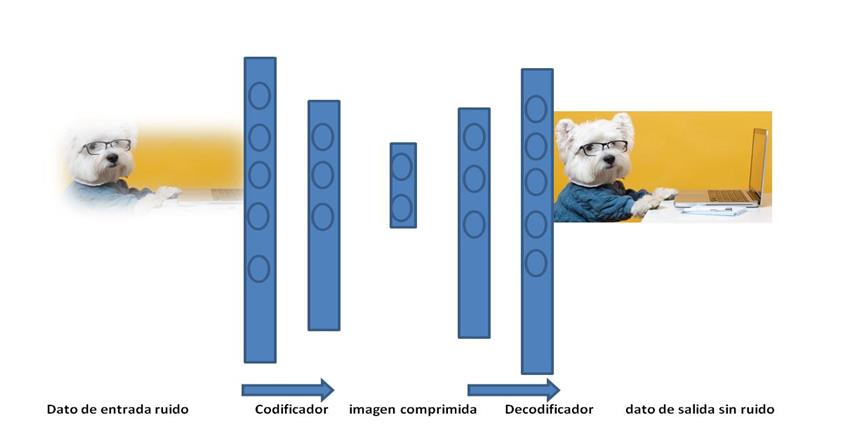

**Para el caso de deteccion de fraude la entrada seran las caracteristicas(features) de los datos**

Se tiene un archivo.csv que tiene unas caracteristicas y una columna llamada fraud=0 si no es fraudulento el pago bancario,fraud=1 si es fraudulento.

Trabajara con los siguientes datos libres:

Fraud Detection on Bank Payments(Detección de fraude en pagos bancarios)
Obtenido de:


*   https://www.kaggle.com/turkayavci/fraud-detection-on-bank-payments/notebook




**Importemos la librería pandas y carguemos el archivo csv**

In [35]:
import pandas as pd # operación en dataframes
import numpy as np # cálculos numéricos
# import random as rnd # implementa generadores de números pseudoaleatorios
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline
# Visualización gráfica
import plotly.express as px
# Diseño y entrenamiento del modelo
# from keras.models import Model, load_model # cargar modelo
from sklearn.model_selection import train_test_split # Creación particiones data de prueba y entrenamiento 
from sklearn.preprocessing import StandardScaler # Normalizador
from sklearn.metrics import accuracy_score
# Métricas de evaluación
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, precision_recall_curve


In [36]:
from tensorflow.keras.optimizers import SGD,Adam # Optimizador
#from keras import optimizers #import Adam, SGD 


In [37]:
dataframe=pd.read_csv('fraude.csv',delimiter=',') # lee el archivo csv, utiliza pd.read_csv('nombre_del_archivo.csv')
dataframe   # Con el nombre del dataframe en este caso data_frame puede ver su contenido.

,step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud
0,0,'C1093826151','4','M','28007','M348934600','28007','es_transportation',4.55,0
1,0,'C352968107','2','M','28007','M348934600','28007','es_transportation',39.68,0
2,0,'C2054744914','4','F','28007','M1823072687','28007','es_transportation',26.89,0
3,0,'C1760612790','3','M','28007','M348934600','28007','es_transportation',17.25,0
4,0,'C757503768','5','M','28007','M348934600','28007','es_transportation',35.72,0
...,...,...,...,...,...,...,...,...,...,...
594638,179,'C1753498738','3','F','28007','M1823072687','28007','es_transportation',20.53,0
594639,179,'C650108285','4','F','28007','M1823072687','28007','es_transportation',50.73,0
594640,179,'C123623130','2','F','28007','M349281107','28007','es_fashion',22.44,0
594641,179,'C1499363341','5','M','28007','M1823072687','28007','es_transportation',14.46,0


los datos tienen 9 columnas(caracterÃ­sticas,features,9 columnas) and a target column(fraude o no fraude). The feature(características de las columnas son :

*   Step: This feature represents the day from the start of simulation. It has 180 steps so simulation ran for virtually 6 months.
*   Customer: This feature represents the customer id

*   zipCodeOrigin: The zip code of origin/source.
*   Merchant: The merchant's id
zipMerchant: The merchant's zip code

*   Age: Categorized age
0: <= 18,
1: 19-25,
2: 26-35,
3: 36-45,
4: 46:55,
5: 56:65,
6: > 65
U: Unknown
*   Gender: Gender for customer
E : Enterprise,
F: Female,
M: Male,
U: Unknown

*   Category: Category of the purchase
*   Fraud: Target variable which shows if the transaction fraudulent(1) or benign(0)


In [38]:
dataframe.head(5) #Muestra las 5 primeras filas

,step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud
0,0,'C1093826151','4','M','28007','M348934600','28007','es_transportation',4.55,0
1,0,'C352968107','2','M','28007','M348934600','28007','es_transportation',39.68,0
2,0,'C2054744914','4','F','28007','M1823072687','28007','es_transportation',26.89,0
3,0,'C1760612790','3','M','28007','M348934600','28007','es_transportation',17.25,0
4,0,'C757503768','5','M','28007','M348934600','28007','es_transportation',35.72,0


In [39]:
dataframe.tail() #Muestra las 5 Ãºltimas filas

,step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud
594638,179,'C1753498738','3','F','28007','M1823072687','28007','es_transportation',20.53,0
594639,179,'C650108285','4','F','28007','M1823072687','28007','es_transportation',50.73,0
594640,179,'C123623130','2','F','28007','M349281107','28007','es_fashion',22.44,0
594641,179,'C1499363341','5','M','28007','M1823072687','28007','es_transportation',14.46,0
594642,179,'C616528518','4','F','28007','M1823072687','28007','es_transportation',26.93,0


**Dimensión y nombre de las columnas**

In [40]:
print("Shape: ", dataframe.shape)# DimensiÃ³n del dataframe:filas y columnas
print("Columnas: ", dataframe.columns)# Nombre de las columnas del dataframe.

Shape:  (594643, 10)
Columnas:  Index(['step', 'customer', 'age', 'gender', 'zipcodeOri', 'merchant',
       'zipMerchant', 'category', 'amount', 'fraud'],
      dtype='object')


In [41]:
dataframe['amount'].describe()#Muestra los valores descriptivos de la columna monto de la transacciÃ³n.

count    594643.000000
mean         37.890135
std         111.402831
min           0.000000
25%          13.740000
50%          26.900000
75%          42.540000
max        8329.960000
Name: amount, dtype: float64

**Imprime información sobre las características o variables**

In [42]:
print(dataframe.info())
print("\nConteo de valores Ãºnicos:\n")
print(dataframe.nunique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594643 entries, 0 to 594642
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   step         594643 non-null  int64  
 1   customer     594643 non-null  object 
 2   age          594643 non-null  object 
 3   gender       594643 non-null  object 
 4   zipcodeOri   594643 non-null  object 
 5   merchant     594643 non-null  object 
 6   zipMerchant  594643 non-null  object 
 7   category     594643 non-null  object 
 8   amount       594643 non-null  float64
 9   fraud        594643 non-null  int64  
dtypes: float64(1), int64(2), object(7)
memory usage: 45.4+ MB
None

Conteo de valores Ãºnicos:

step             180
customer        4112
age                8
gender             4
zipcodeOri         1
merchant          50
zipMerchant        1
category          15
amount         23767
fraud              2
dtype: int64


**Valores faltantes**

In [43]:
print("Are There Missing Data(hay valores faltantes)? :",dataframe.isnull().any().any())
print(dataframe.isnull().sum())

Are There Missing Data(hay valores faltantes)? : False
step           0
customer       0
age            0
gender         0
zipcodeOri     0
merchant       0
zipMerchant    0
category       0
amount         0
fraud          0
dtype: int64


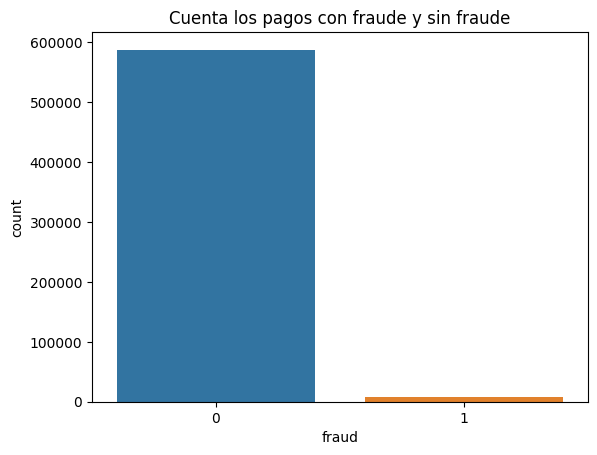

NÃºmero  normal de pagos :  587443
NÃºmero de fraudes:  7200


In [44]:
# Se crea 2 dataframes uno con fraude y otro sin fraude  
df_fraud = dataframe.loc[dataframe.fraud == 1] 
df_non_fraud = dataframe.loc[dataframe.fraud == 0]

sns.countplot(x="fraud",data=dataframe)
plt.title("Cuenta los pagos con fraude y sin fraude")
plt.show()
print("NÃºmero  normal de pagos : ",df_non_fraud.fraud.count())
print("NÃºmero de fraudes: ",df_fraud.fraud.count())


**Gráfico dinámico o interactivo con la librería plotly**

In [45]:
fig = px.histogram(dataframe, x='fraud', histfunc='count')
fig.show()

In [46]:
print("valor promedio de las caracteristicas por categorÃ­a monto y fraude",dataframe.groupby('category')['amount','fraud'].mean())

valor promedio de las caracteristicas por categorÃ­a monto y fraude                               amount     fraud
category                                      
'es_barsandrestaurants'    43.461014  0.018829
'es_contents'              44.547571  0.000000
'es_fashion'               65.666642  0.017973
'es_food'                  37.070405  0.000000
'es_health'               135.621367  0.105126
'es_home'                 165.670846  0.152064
'es_hotelservices'        205.614249  0.314220
'es_hyper'                 45.970421  0.045917
'es_leisure'              288.911303  0.949900
'es_otherservices'        135.881524  0.250000
'es_sportsandtoys'        215.715280  0.495252
'es_tech'                 120.947937  0.066667
'es_transportation'        26.958187  0.000000
'es_travel'              2250.409190  0.793956
'es_wellnessandbeauty'     65.511221  0.047594


/tmp/ipykernel_16381/3802318655.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



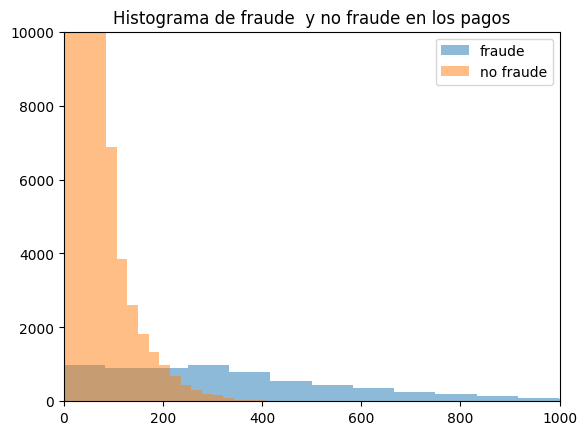

In [47]:
#  histograma por monto con fraude y sin fraude  
plt.hist(df_fraud.amount, alpha=0.5, label='fraude',bins=100)
plt.hist(df_non_fraud.amount, alpha=0.5, label='no fraude',bins=100)
plt.title("Histograma de fraude  y no fraude en los pagos")
plt.ylim(0,10000)
plt.xlim(0,1000)
plt.legend()
plt.show()

**Las columnas zipCodeOri y zipMerchant tienen la misma información, borrar una columna para que quede una sola información para borrar se utiliza drop**

In [48]:
print("Unique zipCodeOri values: ",dataframe.zipcodeOri.nunique())
print("Unique zipMerchant values: ",dataframe.zipMerchant.nunique())
# drop zipcodeori y zipMerchant para tener un valor unico
data_depurada = dataframe.drop(['zipcodeOri','zipMerchant'],axis=1)

Unique zipCodeOri values:  1
Unique zipMerchant values:  1


**Observemos las columnas resultantes:**

In [49]:
data_depurada.columns

Index(['step', 'customer', 'age', 'gender', 'merchant', 'category', 'amount',
       'fraud'],
      dtype='object')

In [50]:
# Cambiando las columnas a categoricas
col_categorical = data_depurada.select_dtypes(include= ['object']).columns
for col in col_categorical:
    data_depurada[col] = data_depurada[col].astype('category')
# valores categoricos ==> valores numericos# Las categorias se cambian por nÃºmeros.
data_depurada[col_categorical] = data_depurada[col_categorical].apply(lambda x: x.cat.codes)
data_depurada.head(5)

,step,customer,age,gender,merchant,category,amount,fraud
0,0,210,4,2,30,12,4.55,0
1,0,2753,2,2,30,12,39.68,0
2,0,2285,4,1,18,12,26.89,0
3,0,1650,3,2,30,12,17.25,0
4,0,3585,5,2,30,12,35.72,0


**Escalar o normalizar el monto del pago a  valores en el intervalo (-1,1)**

In [51]:
from sklearn.preprocessing import StandardScaler

data_depurada['amount'] = StandardScaler().fit_transform(data_depurada['amount'].values.reshape(-1,1))

**Observe la columna amount con valores en el intervalo (-1,1)**

In [52]:
data_depurada

,step,customer,age,gender,merchant,category,amount,fraud
0,0,210,4,2,30,12,-0.299276,0
1,0,2753,2,2,30,12,0.016067,0
2,0,2285,4,1,18,12,-0.098742,0
3,0,1650,3,2,30,12,-0.185275,0
4,0,3585,5,2,30,12,-0.019480,0
...,...,...,...,...,...,...,...,...
594638,179,1639,3,1,18,12,-0.155832,0
594639,179,3369,4,1,18,12,0.115256,0
594640,179,529,2,1,31,2,-0.138687,0
594641,179,1083,5,2,18,12,-0.210319,0


### 3. Diseño del modelo

#### 3.1. Partición del dataframe de entrenamiento (80%) y de prueba (20%)

*   El autoencoder será entrenado únicamente con registros normales,transacciones no fraudulentas para que de esta forma aprenda a obtener una representación compacta de esos datos normales, no fraudulentos

*   Mientras que el de prueba (test) tendrá los dos tipos de registros (normales y fraudulentos)

In [53]:
# con .split se creará la partición de prueba (20%) y la de entrenamiento (80%)
# random_state controla la mezcla aplicada a los datos antes de la partición
X_train, X_test = train_test_split(data_depurada, test_size=0.2, random_state=42)

# se selecciona los registros no fraudulentos para el entrenamiento
X_train = X_train[X_train.fraud == 0]
X_train = X_train.drop(['fraud'], axis=1)# se elimina la columna fraude del set de entrenamiento
X_train = X_train.values

# se crea la partición de prueba con el target
Y_test = X_test['fraud']
X_test = X_test.drop(['fraud'], axis=1) # Se elimina la columna del target 
X_test = X_test.values

### 3.2. Diseño del Autoencoder
* AUTOENCODER: 7-6-4-6-7, las funciones de activación son tangente hiperbólica (tanh), y Relu en el siguiente orden:tanh-relu-tanh-relu

#### 3.2.1. Establecer dimensión de la entrada
* El tamaño de la entrada deberá corresponder con el número de características (columnas) del dataframe de entrenamiento: X_train = 7.

In [54]:
# dimensión de la entrada será = al tamaño del dataframe de entrenamiento
dim_entrada = X_train.shape[1]  
# mostrar valor de tamaño del dataframe de entrenamiento
print('Este será el valor de la dimensión de la entrada del modelo:',dim_entrada)

Este será el valor de la dimensión de la entrada del modelo: 7


#### 3.2.2. Arquitectura del modelo

In [55]:
from keras.layers import Input
import numpy as np
from keras.layers import Dense
from keras.models import Model
# un valor semilla aleatoria

np.random.seed(5) 

dim_entrada = X_train.shape[1] # número de elementos de entrada = 7 son las 7 caracteristicas o features
capa_entrada = Input(shape=(dim_entrada,)) # Entrada
# las capas del encoder tendrán función de activación tangente hiperbólica(TanH) y relu
encoder = Dense(6, activation='tanh')(capa_entrada)# se reduce a 6 caracteristicas(features) = 6 neuronas
encoder = Dense(4, activation='relu')(encoder)# se reduce a 4 caracteristicas(features) = 4 neuronas
# las capas del decoder tendrán función de activación TanH y relu
decoder = Dense(6, activation='tanh')(encoder)# aumenta a 6 caracteristicas(features) = 6 neuronas
decoder = Dense(7, activation='relu')(decoder)# aumenta a 7 lo mismo elementos que en la entrada=7 neuronas
# se crea el autoencoder
autoencoder = Model(inputs=capa_entrada, outputs=decoder)
# mostrar resumen del modelo
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 7)]               0         
                                                                 
 dense_16 (Dense)            (None, 6)                 48        
                                                                 
 dense_17 (Dense)            (None, 4)                 28        
                                                                 
 dense_18 (Dense)            (None, 6)                 30        
                                                                 
 dense_19 (Dense)            (None, 7)                 49        
                                                                 
Total params: 155
Trainable params: 155
Non-trainable params: 0
_________________________________________________________________


### 3.3. Entrenamiento del modelo
* El entrenameinto tendrá: 
##### 1. hiperparámetros: 
* lr: Learning_rate = 0.01
* nits: epochs(número de iteraciones) = 100
* Batch_size: Tamaño de lote = 32
##### 2. Optimizador
* Optimizador: stochastic gradient descent
##### 3. Función de pérdida
* Loss function: mse

In [56]:
# definir optimizador, learning rate(tasa de aprendizaje) # Adam es otro tipo de optimizador
sgd = SGD(learning_rate=0.01) 
# Compilar modelo (optimizador y función de pérdida)
autoencoder.compile(optimizer='sgd', loss='mse') 
# se crea variable nits correspondiente al número de iteraciones (épocas)
nits = 10 
# se crea variable para el tamaño de lote
tam_lote = 128
# Entrenamiento del modelo .fit 
# .fit(entrada, salida, épocas, tamaño de lote, "barajar antes de cada época", datos de validación,
        # mostrar línea de progreso)
autoencoder.fit(X_train, X_train, epochs=nits, batch_size=tam_lote, shuffle=True,
                validation_data=(X_test,X_test), verbose=1)

Epoch 1/10
3672/3672 [==============================] - 6s 2ms/step - loss: 646259.8125 - val_loss: 797521.0625
Epoch 2/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798365.8125 - val_loss: 797521.0625
Epoch 3/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798363.6875 - val_loss: 797521.0625
Epoch 4/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.4375 - val_loss: 797521.0625
Epoch 5/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.2500 - val_loss: 797521.0625
Epoch 6/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798365.3750 - val_loss: 797521.0625
Epoch 7/10
3672/3672 [==============================] 

### 4. Evaluación del modelo
* Se realizará una implementación de predicciones y métricas de evaluación: 

### 4.1. Métricas: matriz de confusión, precisión y recall

#### En teoria, un clasificador ideal no debería generar falsos positivos ni negativos. Sin embargo, ningún clasificador es ideal. Siempre tendrá falsos positivos o negativos.

* **Parámetro precisión:** medida de la cantidad de falsos positivos generados por el clasificador. Si la cantidad de falsos positivos se reduce a 0 la precisión ideal sería 1. TP/ TP + FP

* **Parámetro Recall:** medida de la cantidad de falsos negativos generados por el clasificador. Si la cantidad de falsos negativos se reduce a 0 el recall ideal sería 1. TP / TP + FN

En la práctica no se pueden lograr los dos valores ideales, una mayor precisión significa "sacrificar" un mayor recall y viceversa. Por esto, deberá seleccionarse una en detrimento de la otra.

* **Umbral:** definirá que métrica será favorecida. En este caso queremos evitar el fraude y seleccionaremos el recall (evitar falsos negativos antes que falsos positivos -precisión-)

recall alto Umbral 0.1

0.1 > fraude 0
0.1 < no fraude 1



<p>
FP:Falso positivo:normal clasificado fraudulento
FN:Falso negativo:fraudulento clasificado normal
TN:Verdaderos negativos:normales clasifica normal
TP:Verdaderos positivos:fraudulentos clasificado fraudulento

Matriz de confusion:

**Predicción:** | **Normal** | **Fraude** |  
--- | ---  | ---   | 
**Real:** | ----- | ----- | 
**Normal** | **TN** | **FP** | 
**Fraude** | **FN** | **TP** | 

</p>

3717/3717 [==============================] - 3s 859us/step
(118929, 7)


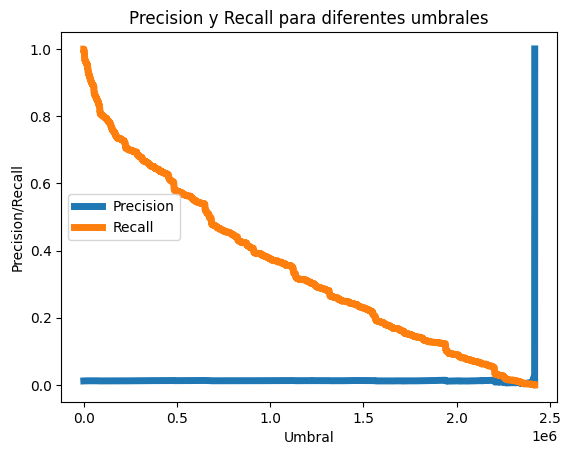

In [57]:
# Predicción X_test -> Autoencoder -> X_pred
#X_test-X_pred = diferencia entre el valor de test y la predicción para ese valor.
X_pred = autoencoder.predict(X_test)
ecm = np.mean(np.power(X_test-X_pred,2), axis=1) # ecm error cuadratico, mean es el promedio
print(X_pred.shape)                 # power(,2) es la función potencia elevada al cuadrado

# define métricas de evaluación y aplica función _recall_curve (entrada - prueba, error cuadrático)
precision, recall, umbral = precision_recall_curve(Y_test, ecm)

# Crear gráfica para visualizar la precisión y el recall para diferentes umbrales
plt.plot(umbral, precision[1:], label="Precision",linewidth=5)
plt.plot(umbral, recall[1:], label="Recall",linewidth=5)
plt.title('Precision y Recall para diferentes umbrales')
plt.xlabel('Umbral')
plt.ylabel('Precision/Recall')
plt.legend()
plt.show()

#### 4.2. Matriz de confusión

In [58]:
# Matriz de confusiÃ³n
umbral_fijo = 0.01 # para obtener un recall alto para clasificar la mayor parte de los fraudes 

Y_pred = [0 if e > umbral_fijo else 1 for e in ecm]
#Y_pred=0 significa registro normal
#Y_pred=1 significa registro con fraude
# una mayor precision significa menor recall y viceversa
#Fijaremos entonces un umbral de 0.1 
#Si el error de la predicción sobrepasa este umbral, asignaremos la categoría (registro fraudulento),
# mientras que si el error es menor o igual al umbral asignaremos la categoría (registro normal):
#error(ecm:error cuadratico medio)
conf_matrix = confusion_matrix(Y_test, Y_pred)
print(conf_matrix)
print(classification_report(Y_test, Y_pred))
print('Accuracy score:',accuracy_score(Y_test, Y_pred))

[[117512      0]
 [  1417      0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    117512
           1       0.00      0.00      0.00      1417

    accuracy                           0.99    118929
   macro avg       0.49      0.50      0.50    118929
weighted avg       0.98      0.99      0.98    118929

Accuracy score: 0.9880853282210394


/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<p>

Matriz de confusión:

**Predicción:** | **Normal** | **Fraude** |  
--- | ---  | ---   | 
**Real:** | ----- | ----- | 
**Normal** | **117512** | **0** | 
**Fraude** | **1417** | **0** | 

</p>

* **117512 TN** normales como normales 
* **1417 FN** normales como fraudulentos 
* **0 FP** fraudulentos como normales 
* **0 TP** fraudulentos como fraudulentos 

<p>

* TP: verdadero positivo = fraude detectado como fraude 
* TN: verdaderos negativos = normal detectado como normal
* FN: falso negativo = fraude detectado como normal
* FP: falso positivo = normal detectado como fraude

Matriz de confusión:

**Predicción:** | **Normal** | **Fraude** |  
--- | ---  | ---   | 
**Real:** | ----- | ----- | 
**Normal** | **TN** | **FP** | 
**Fraude** | **FN** | **TP** | 

</p>

#### 4.3. Exactitud

In [59]:
print('Accuracy score:',accuracy_score(Y_test, Y_pred))

Accuracy score: 0.9880853282210394


## Actividad

### 1. Conteste las siguientes preguntas

1.  Accuracy score alto=98%  ¿Cómo cambiaría esto? ¿Qué significa ese valor? ¿Está favoreciendo a los registros fraudulentos

2. La matriz de confunsión arroja unos valores cero, por eso al calcular la medida de precision F-score da indeterminado al dividir por el número cero. ¿Cómo arreglaría esto?
3. De 118929 datos, 117512 eran normales y fueron clasificados como tales. 1417 eran fraudulentos y se clasificaron como normales. ¿Cómo arreglaría esto?
4. ¿Ese modelo está funcionando? ¿Cómo mejoraría el modelo anterior?
5. Los datos están desbalanceados ¿Cómo lo arreglaría?
* Numero  normal :  587443
* Numero de fraudes:  7200 
7. Cambie los valores del encoder y decoder para construir el autoencoder y las funciones de activación. En el ejemplo del ejercicio está AUTOENCODER: 7-6-4-6-7 las funciones de activación son tangente hiperbolica (TanH), y Relu: en el siguiente orden:tanh-relu-tanh-relu. Observe los resultados. Ejemplo 7-5-4-5-7

De 118929 datos ,117512  eran normales y fueron clasificados como normales. 1417 eran fraudulentos y se clasificaron como normales. ¿Cómo arreglaría esto? 

#### Respuestas parte 1:

1. Este valor indica un posible overfitting, por lo cual es necesario revisar la parte de feature engineering, que variables fueron normalizadas, se eliminaría el feature de identificación y crearía data sintética junto a una técnica estaística SMOTE para calibrar el desbalanceo de clases.

2. Si la matriz de confusión tiene valores en cero quiere decir que el modelo se debe re-entrenar completamente, está sobreajustado.

3. Este problema se ajustaría arreglando el desbalance de clases, es decir, simulando más data fraudulenta dado que el modelo va a inferir mejores resultado de lo que lo hace actualmente.


4. No, el modelo no funciona bien por el sobreajuste, revisaría las features, su normalización y aplicaria generación de data sintética y realizaría un tuning de hiperaparámetros para que el modelo sea más adecuado.


5. Se arreglaría con la técnica SMOTE, que replica data fraudulenta para que el modelo tenga más info a la hora de entrenarse.



6. Los valores que arroja la matriz de confusión siguen saliendo con un overfitting, se debe revisar todo el modelo.

In [80]:
# Matriz de confusiÃ³n
umbral_fijo = 0.05 # para obtener un recall alto para clasificar la mayor parte de los fraudes 

Y_pred = [0 if e > umbral_fijo else 1 for e in ecm]
#Y_pred=0 significa registro normal
#Y_pred=1 significa registro con fraude
# una mayor precision significa menor recall y viceversa
#Fijaremos entonces un umbral de 0.1 
#Si el error de la predicción sobrepasa este umbral, asignaremos la categoría (registro fraudulento),
# mientras que si el error es menor o igual al umbral asignaremos la categoría (registro normal):
#error(ecm:error cuadratico medio)
conf_matrix = confusion_matrix(Y_test, Y_pred)
print(conf_matrix)
print(classification_report(Y_test, Y_pred))
print('Accuracy score:',accuracy_score(Y_test, Y_pred))

[[117512      0]
 [  1417      0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    117512
           1       0.00      0.00      0.00      1417

    accuracy                           0.99    118929
   macro avg       0.49      0.50      0.50    118929
weighted avg       0.98      0.99      0.98    118929

Accuracy score: 0.9880853282210394


7. Solución modificacóon autoencoder punt7 :
Cambie los valores del encoder y decoder para construir el autoencoder y las funciones de activación. En el ejemplo del ejercicio está AUTOENCODER: 7-6-4-6-7 las funciones de activación son tangente hiperbolica (TanH), y Relu: en el siguiente orden:tanh-relu-tanh-relu. Observe los resultados. 
Ejemplo 7-5-4-5-7

In [81]:
from keras.layers import Input
import numpy as np
from keras.layers import Dense
from keras.models import Model
# un valor semilla aleatoria

np.random.seed(5) 

dim_entrada = X_train.shape[1] # número de elementos de entrada = 7 son las 7 caracteristicas o features
capa_entrada = Input(shape=(dim_entrada,)) # Entrada
# las capas del encoder tendrán función de activación tangente hiperbólica(TanH) y relu
encoder = Dense(5, activation='tanh')(capa_entrada)# se reduce a 6 caracteristicas(features) = 6 neuronas
encoder = Dense(4, activation='relu')(encoder)# se reduce a 4 caracteristicas(features) = 4 neuronas
# las capas del decoder tendrán función de activación TanH y relu
decoder = Dense(5, activation='tanh')(encoder)# aumenta a 6 caracteristicas(features) = 6 neuronas
decoder = Dense(7, activation='relu')(decoder)# aumenta a 7 lo mismo elementos que en la entrada=7 neuronas
# se crea el autoencoder
autoencoder = Model(inputs=capa_entrada, outputs=decoder)
# mostrar resumen del modelo
autoencoder.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 7)]               0         
                                                                 
 dense_62 (Dense)            (None, 5)                 40        
                                                                 
 dense_63 (Dense)            (None, 4)                 24        
                                                                 
 dense_64 (Dense)            (None, 5)                 25        
                                                                 
 dense_65 (Dense)            (None, 7)                 42        
                                                                 
Total params: 131
Trainable params: 131
Non-trainable params: 0
_________________________________________________________________


3717/3717 [==============================] - 3s 808us/step
(118929, 7)


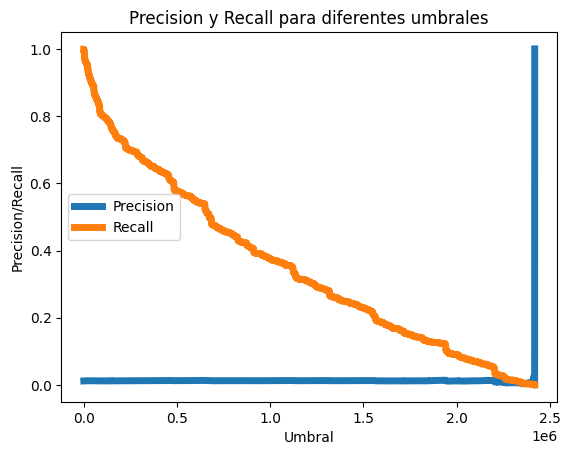

In [82]:
# Predicción X_test -> Autoencoder -> X_pred
#X_test-X_pred = diferencia entre el valor de test y la predicción para ese valor.
X_pred = autoencoder.predict(X_test)
ecm = np.mean(np.power(X_test-X_pred,2), axis=1) # ecm error cuadratico, mean es el promedio
print(X_pred.shape)                 # power(,2) es la función potencia elevada al cuadrado

# define métricas de evaluación y aplica función _recall_curve (entrada - prueba, error cuadrático)
precision, recall, umbral = precision_recall_curve(Y_test, ecm)

# Crear gráfica para visualizar la precisión y el recall para diferentes umbrales
plt.plot(umbral, precision[1:], label="Precision",linewidth=5)
plt.plot(umbral, recall[1:], label="Recall",linewidth=5)
plt.title('Precision y Recall para diferentes umbrales')
plt.xlabel('Umbral')
plt.ylabel('Precision/Recall')
plt.legend()
plt.show()

In [83]:
# Matriz de confusiÃ³n
umbral_fijo = 0.01 # para obtener un recall alto para clasificar la mayor parte de los fraudes 

Y_pred = [0 if e > umbral_fijo else 1 for e in ecm]
#Y_pred=0 significa registro normal
#Y_pred=1 significa registro con fraude
# una mayor precision significa menor recall y viceversa
#Fijaremos entonces un umbral de 0.1 
#Si el error de la predicción sobrepasa este umbral, asignaremos la categoría (registro fraudulento),
# mientras que si el error es menor o igual al umbral asignaremos la categoría (registro normal):
#error(ecm:error cuadratico medio)
conf_matrix = confusion_matrix(Y_test, Y_pred)
print(conf_matrix)
print(classification_report(Y_test, Y_pred))
print('Accuracy score:',accuracy_score(Y_test, Y_pred))

[[117512      0]
 [  1417      0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    117512
           1       0.00      0.00      0.00      1417

    accuracy                           0.99    118929
   macro avg       0.49      0.50      0.50    118929
weighted avg       0.98      0.99      0.98    118929

Accuracy score: 0.9880853282210394


/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [84]:
# definir optimizador, learning rate(tasa de aprendizaje) # Adam es otro tipo de optimizador
sgd = SGD(learning_rate=0.01) 
# Compilar modelo (optimizador y función de pérdida)
autoencoder.compile(optimizer='sgd', loss='mse') 
# se crea variable nits correspondiente al número de iteraciones (épocas)
nits = 10 
# se crea variable para el tamaño de lote
tam_lote = 128
# Entrenamiento del modelo .fit 
# .fit(entrada, salida, épocas, tamaño de lote, "barajar antes de cada época", datos de validación,
        # mostrar línea de progreso)
autoencoder.fit(X_train, X_train, epochs=nits, batch_size=tam_lote, shuffle=True,
                validation_data=(X_test,X_test), verbose=1)

Epoch 1/10
3672/3672 [==============================] - 6s 1ms/step - loss: 797720.0625 - val_loss: 797521.0625
Epoch 2/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.0000 - val_loss: 797521.0625
Epoch 3/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798363.3750 - val_loss: 797521.0625
Epoch 4/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.7500 - val_loss: 797521.0625
Epoch 5/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.6250 - val_loss: 797521.0625
Epoch 6/10
3672/3672 [==============================] - 5s 1ms/step - loss: 798364.3125 - val_loss: 797521.0625
Epoch 7/10
3672/3672 [==============================] - 

# **Implemente:**



1. Modifique el tipo de optimizador diferente a optimizer='adam'
2. Modifique los valores de learning rate, ejemplo lr=0.001
3. Modifique epochs,batch_size,ejemplo epochs=10, batch_size=120
4. Agregue una capa oculta al modelo con 256 neuronas.
5. Modifique Dropout, ejemplo Dropout=0.2. Esto permite excluir aleatoriamente el 20% de las neuronas en el entrenamiento para evitar el sobreajuste
6. Modifique loss dentro de model.compile(), diferente a loss='categorical_crossentropy'
7. Imprima las capas de neuronas del modelo print(model.summary())
8. Guarde el modelo model.save('modeloinicial.h5')# pip install h5py
9. Guarde los pesos del modelo mediante: model.save_weights('model_pesos.h5')
10. Analice los resultados

#### Solución Puntos 1 y 2


**Modifique el tipo de optimizador diferente a optimizer='adam'**
**Modifique los valores de learning rate, ejemplo lr=0.001**


Para este punto, realizaremos de nuevo el entrenamiento y compilación del modelo.

Nota: De acuerdo a documentación oficial el optimizer Adam, tiene un leaarning rate por default de 0.001

In [74]:
import tensorflow.keras as keras
from keras.models import Model
learning_rate = 0.01
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)


In [76]:
from keras import layers

dim_entrada = X_train.shape[1] # número de elementos de entrada = 7 son las 7 caracteristicas o features
capa_entrada = Input(shape=(dim_entrada,)) # Entrada


# Capa oculta 1: 256 neuronas y Dropout de 0.2
codificacion_1 = layers.Dense(256, activation='relu')(capa_entrada)
capa_dropout = layers.Dropout(0.2)(codificacion_1)

# las capas del encoder tendrán función de activación tangente hiperbólica(TanH) y relu
encoder_1 = Dense(6, activation='tanh')(capa_dropout)# se reduce a 6 caracteristicas(features) = 6 neuronas
encoder_2 = Dense(4, activation='relu')(encoder_1)# se reduce a 4 caracteristicas(features) = 4 neuronas
# las capas del decoder tendrán función de activación TanH y relu
decoder_1 = Dense(6, activation='tanh')(encoder_2)# aumenta a 6 caracteristicas(features) = 6 neuronas

# Capa oculta 2: 256 neuronas
codificacion_2 = layers.Dense(256, activation='relu')(decoder_1)


decoder_2 = Dense(7, activation='relu')(codificacion_2)# aumenta a 7 lo mismo elementos que en la entrada=7 neuronas
# se crea el autoencoder
autoencoder = Model(inputs=capa_entrada, outputs=decoder_2)
# mostrar resumen del modelo
autoencoder.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 7)]               0         
                                                                 
 dense_56 (Dense)            (None, 256)               2048      
                                                                 
 dropout_8 (Dropout)         (None, 256)               0         
                                                                 
 dense_57 (Dense)            (None, 6)                 1542      
                                                                 
 dense_58 (Dense)            (None, 4)                 28        
                                                                 
 dense_59 (Dense)            (None, 6)                 30        
                                                                 
 dense_60 (Dense)            (None, 256)               179

De acuerdo a lo anterior, recompilamos el modelo:

In [77]:
autoencoder.compile(optimizer=optimizer, loss='binary_crossentropy')

#### Solución Punto 3:

**Modifique epochs,batch_size,ejemplo epochs=10, batch_size=120*

Ahora, vamos a entrenar nuestro autoencoder de acuerdo a las condiciones solicitadas: 10 fases de training y batchs (lotes) de 120 registros:


In [78]:
autoencoder.fit(X_train, X_train,
                epochs=10,
                batch_size=120,
                shuffle=True,validation_data=(X_test, X_test))

Epoch 1/10
3917/3917 [==============================] - 10s 2ms/step - loss: -4310.1426 - val_loss: -4311.8945
Epoch 2/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4314.0010 - val_loss: -4311.8945
Epoch 3/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4314.0034 - val_loss: -4311.8945
Epoch 4/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4314.0107 - val_loss: -4311.8945
Epoch 5/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4313.9956 - val_loss: -4311.8945
Epoch 6/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4313.9956 - val_loss: -4311.8945
Epoch 7/10
3917/3917 [==============================] - 9s

#### Solución Puntos 4,5 y 6:

**4.Agregue una capa oculta al modelo con 256 neuronas** y

**5. Modifique Dropout, ejemplo Dropout=0.2. Esto permite excluir aleatoriamente el 20% de las neuronas en el entrenamiento para evitar el sobreajuste**

**6. Modifique loss dentro de model.compile(), diferente a loss='categorical_crossentropy'**


Estas nuevas líneas de código se agregan en la línea 4, 6 y 16 respectivamente de la siguiente celda:

In [70]:
dim_entrada = X_train.shape[1] # número de elementos de entrada = 7 son las 7 caracteristicas o features
capa_entrada = Input(shape=(dim_entrada,)) # Entrada


# Capa oculta 1: 256 neuronas y Dropout de 0.2
codificacion_1 = layers.Dense(256, activation='relu')(capa_entrada)
capa_dropout = layers.Dropout(0.2)(codificacion_1)

# las capas del encoder tendrán función de activación tangente hiperbólica(TanH) y relu
encoder_1 = Dense(6, activation='tanh')(capa_dropout)# se reduce a 6 caracteristicas(features) = 6 neuronas
encoder_2 = Dense(4, activation='relu')(encoder_1)# se reduce a 4 caracteristicas(features) = 4 neuronas
# las capas del decoder tendrán función de activación TanH y relu
decoder_1 = Dense(6, activation='tanh')(encoder_2)# aumenta a 6 caracteristicas(features) = 6 neuronas

# Capa oculta 2: 256 neuronas
codificacion_2 = layers.Dense(256, activation='relu')(decoder_1)


decoder_2 = Dense(7, activation='relu')(codificacion_2)# aumenta a 7 lo mismo elementos que en la entrada=7 neuronas
# se crea el autoencoder
autoencoder = Model(inputs=capa_entrada, outputs=decoder_2)

autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.fit(X_train, X_train, epochs=10, batch_size=120, shuffle=True, validation_data=(X_test, X_test))



Epoch 1/10
3917/3917 [==============================] - 11s 3ms/step - loss: -4652.1489 - val_loss: -4679.4946
Epoch 2/10
3917/3917 [==============================] - 10s 2ms/step - loss: -4681.9111 - val_loss: -4679.4946
Epoch 3/10
3917/3917 [==============================] - 10s 2ms/step - loss: -4681.9087 - val_loss: -4679.4946
Epoch 4/10
3917/3917 [==============================] - 9s 2ms/step - loss: -4681.9121 - val_loss: -4679.4946
Epoch 5/10
3917/3917 [==============================] - 10s 3ms/step - loss: -4681.8936 - val_loss: -4679.4946
Epoch 6/10
3917/3917 [==============================] - 10s 2ms/step - loss: -4681.9038 - val_loss: -4679.4946
Epoch 7/10
3917/3917 [==============================] - 9s

#### Solución Punto 7:

**Imprima las capas de neuronas del modelo print(model.summary())**

In [66]:
# mostrar resumen del modelo
print(autoencoder.summary())

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 7)]               0         
                                                                 
 dense_26 (Dense)            (None, 256)               2048      
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_27 (Dense)            (None, 6)                 1542      
                                                                 
 dense_28 (Dense)            (None, 4)                 28        
                                                                 
 dense_29 (Dense)            (None, 6)                 30        
                                                                 
 dense_30 (Dense)            (None, 256)               1792

Nota:

Se realiza el mismo ejercicio de la celda anterior de una forma más práctica

#### Solución Punto 8:

**Guarde el modelo model.save('modeloinicial.h5')# pip install h5py**

In [71]:
# Guardar el modelo y sus pesos con extension .h5
autoencoder.save('autoencoder_semana8_MichaelMora.h5')

#### Solución Punto 9:

**Guarde los pesos del modelo mediante: model.save_weights('model_pesos.h5')**

In [72]:
# Guardar el modelo y sus pesos con extension .h5
autoencoder.save_weights('weigths_autoencoder_semana8_MichaelMora.h5')

# Conclusiones:

A lo largo de este ejercicio podemos concluir lo siguiente:

* Los autoencoders como tal tienen 3 fases, la primera de inputs, la segunda es una capa de compresión de información tomando lo más representativo del dataset (en este caso imágenes del MNIST) y luego lo descomprime. Posteriormente al compilar el modelo intenta reconstruir el inpunt en la capa de entrada de la red neuronal siendo lo más cercano posible.


* Este tipo de red neuronal es muy importante para reducir características o ruidos dentro de imágenes.


* Es muy importante la legibilidad del código y documentación para mejor entendimiento. Además es necesario plantear funciones para optimización.

* Normalizar las feature para que queden en un rango de 0 a 1 ayuda a la convergencia del modelo y al uso eficiente de recursos computacionales. Sería conveniente eliminar el feature de identificación del ciente ya que puede generar sesgos en el modelo.

* Sería bastante útil clusterizar los tipos de industria en los cuales se analizan estas transacciones.

* Es muy importante tener en cuenta el desbalanceo de clases en detección de fraude, ya que normalmente la cantidad de registros fraudulentos es mucho menor versus la data sin fraude. Existen técnicas de oversampling y generación de data sintética para ajustar este desbalanceo dado que el modelo puedo salir no muy preciso. Esta condición particular podría ser también tratada con autoencoders para generar data similar fraudulenta estructurada.

* Frente a la matriz de confusión es importante tener en cuenta que si queremos detectar la mayoría de casos posibles de fraude, debemos colocar atención en los True positives y en la reducción de False positives, es decir casos que son fraude y no se detectaron con el modelo. Por otra parte, si quiero enfocarme en aprobar transacciones no fraudulentas debo enfocarme en reducir los false negatives. Es importante tener en cuenta el caso de negocio y el impacto en motores y reglas antifraude además de la afectación a los merchants dado que pueden tener foco en aprobar el máximo de transacciones posibles junto a un umbral máximo de fraude sea en dinero o número de transacciones. Para este caso de negocio nuestro foco es en la métrica de recall para detectar la mayor cantidad de transacciones fraudulentas posible.

* Al tener desalanceo de data, debemos ser cuidadosos con caer en un overfitting o sobreajuste.


* Para el ejercicio 4 de la actividad 2 agregar la capa de 256 neuronas se debe revisar y analizar si es necesaria o no dado que genera resultados negativos frente a su fase de entrenamiento en las funciones de pérdida.

* Para el punto 7 de la actividad 1 al modificar la estructura del encoder 7-6-4-6-7 a 7-5-4-5-7 los cambios nos son significativos.


### Referencias:
    
* Bonaccorso, G. (2018). Mastering Machine Learning Algorithms: Expert Techniques to Implement Popular 
Machine Learning Algorithms and Fine-Tune your Models. PP. 441-470.

* Fandango, A. (2018). Mastering TensorFlow 1. x: Advanced Machine Learning and Deep Learning Concepts 
Using TensorFlow 1. x and Keras.Pp. 73-111.

* TensorFlow. (n.d.). Basic classification: Classify images of clothing. Retrieved from https://www.tensorflow.org/tutorials/keras/classification

* Keras. (n.d.). Convolutional autoencoder for image denoising. Retrieved from https://keras.io/examples/vision/autoencoder/

* Chollet, F. (2018, February 5). Building Autoencoders in Keras. Retrieved from https://blog.keras.io/building-autoencoders-in-keras.html

* Hubens, N. (2020, August 4). Autoencoders. Retrieved from https://github.com/nathanhubens/Autoencoders/tree/master

## Nota:

La siguiente imagen muestra en el panel izquierdo los archivos generados de los modelos entrenados en formato h5py:


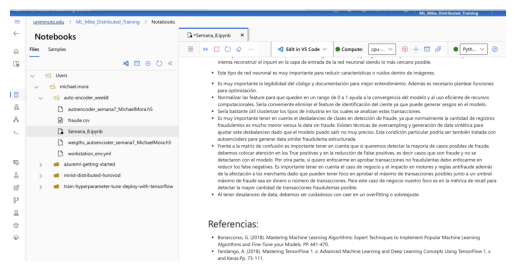

In [73]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Ruta de la imagen
image_path = 'save_model_and_weights.png'

# Lee la imagen
image = mpimg.imread(image_path)

# Muestra la imagen
plt.imshow(image)
plt.axis('off')  # Opcional: para ocultar los ejes
plt.show()